# Image Pre Processing


See image pre-processing decisions and notes

Preprocesses images loaded from the class balanced data set.
Uses previsouly extracted class_balanced_image_ids.csv file to ginf image ids that beling to balanced classes



    Image preprocessing issues and how addressed:

    1) Crop the image: No. Images are already focused on the lesion, are already centered and tightly cropped dermatoscopic images of the lesions. For simple feature extraction, additional cropping may remove useful context. Decision: no cropping.

    2) Center the image: images are already centered. Decision: No.

    3) Presence of hairs - can make mode mistake hairs as lesion boundaries or features. Decision: Hairs need to be used. Used ‘dull razor’ approach, as a preprocessing step; the approach detects hair using morphological operations and inpaints (fills) the detected regions. Use cv2 library (blackout filtering to find hair, threshold to detect hair, inpaint to remove hair)

    4) Handling scale markers on some images: if scale markers are present in a consistent region, that region can be cropped off. Scale markers do impact simple feature extraction e.g. for histogram bins, texture patterns. Decision: mask scale markers using  edge detector such as Canny.
    5) Resize all images to a fixed shape 224,224

    6) Gaussian blur as part of reimaging (Prof Hany's recommendation) to reduce noise? No, since blurr may reduce color variance and flatten histogrtam peaks for color histograms, may smoot edges and weaken gradients for Histogram of Oriented Gradience (HOG), remove sharp transitions for edge detection. 


    Summary: No crop, no center, remove hairs, mask scale, resize to 224 x 224. No Gaussian blur.


In [2]:
import numpy as np
import cv2 # OpenCV library
import matplotlib.pyplot as plt
from PIL import Image
import urllib

from skimage.exposure import rescale_intensity
from skimage.transform import rescale, rotate
from skimage.color import rgb2gray
from skimage.feature import hog
from sklearn.metrics import mean_squared_error
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import cosine
from skimage import exposure

In [3]:
# standard
import pandas as pd
import numpy as np
import random
import os

# tf and keras
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling1D
from tensorflow.keras.layers import GlobalAveragePooling1D
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import tensorflow_datasets as tfds

from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

import keras
import keras_tuner as kt

from keras import layers, models
from keras.optimizers import Adam
from tensorflow.keras import layers, optimizers
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import load_model

from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

from sklearn.metrics import confusion_matrix

import joblib

# shap
#import shap

import openpyxl

# plots and images
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image

# others
import re
from sklearn.decomposition import PCA

import os
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

#from wordcloud import WordCloud
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

#silence TF
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'


random.seed(42)


In [4]:
def whoAmI(img):
    """
    Prints dtype, min, max, mean, height, and width of an image.
    """
    print(f"dtype     : {img.dtype}")
    print(f"min       : {np.min(img):.4f}")
    print(f"max       : {np.max(img):.4f}")
    print(f"mean      : {np.mean(img):.4f}")
    print(f"shape     : {img.shape}")
    if img.ndim == 2:
        print(f"height    : {img.shape[0]}")
        print(f"width     : {img.shape[1]}")
    elif img.ndim == 3:
        print(f"height    : {img.shape[0]}")
        print(f"width     : {img.shape[1]}")
        print(f"channels  : {img.shape[2]}")

#VS - II helpful functions

# summarizes a data frame in a printer friendly way
def summarize_dataframe(df):
    summary = pd.DataFrame({
        'Column Name': df.columns,
        'Data Type': df.dtypes.values,
        'Null Count': df.isnull().sum().values,
        'Non-Null Count': df.notnull().sum().values,
        'Unique Count': df.nunique().values
    })
    return summary

def plot_training_history(history):
    """
    Plots training and validation loss & accuracy from a Keras history object.

    Parameters:
    - history: Keras history object from model.fit()
    """

    epochs = range(1, len(history.history['loss']) + 1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']


    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    ax[0].plot(epochs, train_loss, label='Training Loss', color='blue', linestyle='-')
    ax[0].plot(epochs, val_loss, label='Validation Loss', color='red', linestyle='--')
    ax[0].set_title('Training & Validation Loss')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss')
    ax[0].legend()

    ax[1].plot(epochs, train_acc, label='Training Accuracy', color='blue', linestyle='-')
    ax[1].plot(epochs, val_acc, label='Validation Accuracy', color='red', linestyle='--')
    ax[1].set_title('Training & Validation Accuracy')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Accuracy')
    ax[1].legend()

    plt.tight_layout()
    plt.show()

In [5]:
DATA_DIR = '/Users/vishalsaxena/Documents/BERKMIDS2024ROOT/09MIDSCourses/MIDS281CompVision/281_Final_Project/281_FP_Factory/dataset/skin-cancer-mnist-ham10000/'
DATA_DIR_IMAGES = DATA_DIR + '/HAM10000_images/'

BALANCED_CLASS_CSV_FILE = '/Users/vishalsaxena/Documents/BERKMIDS2024ROOT/09MIDSCourses/MIDS281CompVision/281_Final_Project/281_FP_Factory/class_balanced_image_ids.csv'


In [14]:
def load_raw_image_files_and_class_labels(image_folder_path=DATA_DIR_IMAGES, csv_file_path=BALANCED_CLASS_CSV_FILE):
    """
    Using image id from the balanced class csv file, loads jpg images into a raw array.
    Matching class labels are loaded into another array.
    3 arrays returned: array of image ids, array of their matching raw images, array of their matching class labels
    
    """
    try:
        df = pd.read_csv(csv_file_path)
        print(f"Successfully loaded CSV file: {csv_file_path}")
        print(f"Total entries in CSV: {len(df)}")
    except FileNotFoundError:
        print(f"Error: CSV file not found at {csv_file_path}")
        return np.array([], dtype=object), np.array([])
    except Exception as e:
        print(f"Error loading CSV file: {e}")
        return np.array([], dtype=object), np.array([])

    image_ids = []
    raw_images = []
    raw_labels = []

    print("Starting to load images...")
    for index, row in df.iterrows():
        image_id = row['index']
        class_label = row['dx']

        image_filename = f"{image_id}.jpg"
        image_full_path = os.path.join(image_folder_path, image_filename)

        try:
            img = Image.open(image_full_path)
            image_ids.append(image_id)
            raw_images.append(img)
            raw_labels.append(class_label)

        except FileNotFoundError:
            print(f"Warning: Image file not found for {image_id} at {image_full_path}. Skipping.")
        except Exception as e:
            print(f"Error loading image {image_id} from {image_full_path}: {e}. Skipping.")

    print(f"Finished loading {len(raw_images)} images.")

    print("\n--- Loading Summary ---")
    print(f"Lenght of raw_images list (list of image arrays): {len(raw_images)}")
    print(f"Length of raw_labels: {len(raw_labels)}")
    print(f"First 5 labels: {raw_labels[:5]}")

    return image_ids, raw_images, raw_labels

# Hair removal
def remove_hairs(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 9))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    _, thresh = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)
    result = cv2.inpaint(img, thresh, 1, cv2.INPAINT_TELEA)
    return result


# Canny to mask scale

def mask_scale_markers(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if w * h > 500 and (w/h > 5 or h/w > 5):
            img[y:y+h, x:x+w] = 0  # mask with black
    return img


In [15]:
raw_image_ids, raw_images, raw_labels = load_raw_image_files_and_class_labels()

Successfully loaded CSV file: /Users/vishalsaxena/Documents/BERKMIDS2024ROOT/09MIDSCourses/MIDS281CompVision/281_Final_Project/281_FP_Factory/class_balanced_image_ids.csv
Total entries in CSV: 8659
Starting to load images...
Finished loading 8659 images.

--- Loading Summary ---
Lenght of raw_images list (list of image arrays): 8659
Length of raw_labels: 8659
First 5 labels: ['nv', 'vasc', 'nv', 'bkl', 'mel']


In [11]:
type(raw_images[0])

PIL.JpegImagePlugin.JpegImageFile

In [12]:
# Remove hairs
hair_removed_images = [remove_hairs(np.array(img)) for img in raw_images]
hair_removed_images = np.array(hair_removed_images)

In [16]:
len(hair_removed_images)

8659

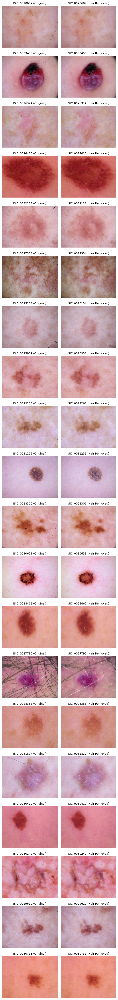

In [18]:
#Plot 20 randomly selected images and their hair removed versions


# Sample 20 random indices
random.seed(42)
sample_indices = random.sample(range(len(raw_images)), 20)

# Set up grid: 20 rows (one per image pair), 2 columns (original, hair-removed)
fig, axes = plt.subplots(20, 2, figsize=(6, 50))  # taller layout

for row, idx in enumerate(sample_indices):
    # Get images and ID
    orig_img = np.array(raw_images[idx])
    clean_img = np.array(hair_removed_images[idx])
    image_id = raw_image_ids[idx]

    # Column 0: Original
    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"{image_id} (Original)", fontsize=10)
    axes[row, 0].axis("off")

    # Column 1: Hair Removed
    axes[row, 1].imshow(clean_img)
    axes[row, 1].set_title(f"{image_id} (Hair Removed)", fontsize=10)
    axes[row, 1].axis("off")

# Adjust layout
plt.tight_layout()
plt.show()


In [30]:
# Now apply canny to mask scale (remove ruler markings)
scale_removed_images = [mask_scale_markers(np.array(img)) for img in hair_removed_images]
scale_removed_images = np.array(scale_removed_images)

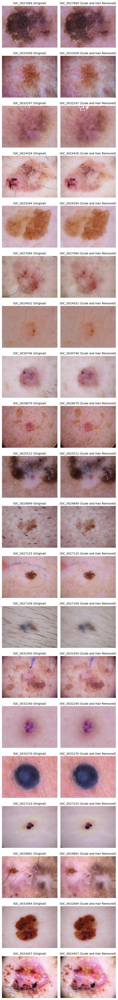

In [31]:
#Plot 20 randomly selected images and their hair and scale removed versions

# Sample 20 random indices
sample_indices = random.sample(range(len(raw_images)), 20)

# Set up grid: 20 rows (one per image pair), 2 columns (original, scaled_removed_images)
fig, axes = plt.subplots(20, 2, figsize=(6, 50))  # taller layout

for row, idx in enumerate(sample_indices):
    # Get images and ID
    orig_img = np.array(raw_images[idx])
    clean_img = np.array(scale_removed_images[idx])
    image_id = raw_image_ids[idx]

    # Column 0: Original
    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"{image_id} (Original)", fontsize=10)
    axes[row, 0].axis("off")

    # Column 1: Hair Removed
    axes[row, 1].imshow(clean_img)
    axes[row, 1].set_title(f"{image_id} (Scale and Hair Removed)", fontsize=10)
    axes[row, 1].axis("off")

# Adjust layout
plt.tight_layout()
plt.show()

In [32]:
scale_removed_images.shape

(8659, 450, 600, 3)

In [ ]:
#resize to 224 x 224

resized_scale_removed_images = [cv2.resize(np.array(img), (224,224)) for img in scale_removed_images]
resized_scale_removed_images = np.array(resized_scale_removed_images)

In [34]:
resized_scale_removed_images.shape

(8659, 224, 224, 3)

In [36]:
raw_labels = np.array(raw_labels)
raw_labels.shape

(8659,)

In [39]:
raw_image_ids = np.array(raw_image_ids)
raw_image_ids.shape

(8659,)

# MILESTONE: The image ids, images and labels to use for resized scale removed and simple feature extraction 
    raw_image_ids
    resized_scale_removed_images,
    raw_labels

In [37]:
# HOG
# =============================================
# Extract HOG Features
# =============================================
hog_features = []
hog_images = []

for img in resized_scale_removed_images:
    gray_img = rgb2gray(img)  #firs gray scale the rgb image, a requiremeent for hog feature extraction
    features, hog_img = hog(
        gray_img,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        block_norm='L2-Hys',
        visualize=True
    )
    hog_features.append(features)
    hog_img_rescaled = exposure.rescale_intensity(hog_img, in_range=(0, 10))  # adjust in_range if needed
    hog_images.append(hog_img_rescaled)

hog_features = np.array(hog_features)

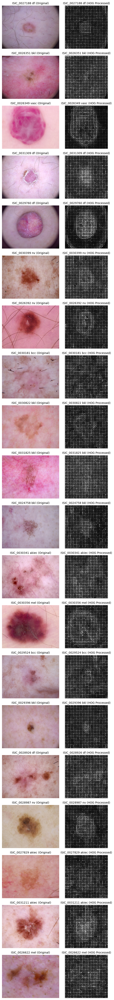

In [41]:
# =============================================
# Visualize Original and HOG Side-by-Side Grid (random selection)
# =============================================

sample_indices = random.sample(range(len(raw_images)), 20)

# Set up grid: 20 rows (one per image pair), 2 columns (original, scaled_removed_images)
fig, axes = plt.subplots(20, 2, figsize=(6, 50))  # taller layout

for row, idx in enumerate(sample_indices):
    # Get images and ID
    orig_img = np.array(raw_images[idx])
    hog_img = np.array(hog_images[idx])
    image_id = raw_image_ids[idx]
    label = raw_labels[idx]

    # Column 0: Original
    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title(f"{image_id} {label} (Original)", fontsize=10)
    axes[row, 0].axis("off")

    # Column 1: Hair Removed
    #axes[row, 1].imshow(hog_img)
    axes[row, 1].imshow(hog_img, cmap='gray', vmin=0, vmax=0.001) #sharper resolution to see hog features
    axes[row, 1].set_title(f"{image_id} {label} (HOG Processed)", fontsize=10)
    axes[row, 1].axis("off")

# Adjust layout
plt.tight_layout()
plt.show()

In [42]:
hog_features.shape

(8659, 26244)

# Lets run Random Forest Classifier with cross validation
    Because we are running cross validation, we do not need validation data set separately, but still need test data
    We use stratify y to retain y class distribution in test similar to training data set


In [44]:
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(raw_labels)

# Step 1: Split into train_val and test
X_trainval, X_test, y_trainval, y_test = train_test_split(
    hog_features, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Step 2: Cross-validation on train_val
rf = RandomForestClassifier(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42)
cv_results = cross_validate(rf, X_trainval, y_trainval, cv=5, scoring='accuracy')
print("CV Mean Accuracy:", np.mean(cv_results['test_score']))

# Step 3: Train final model on train_val
rf.fit(X_trainval, y_trainval)




CV Mean Accuracy: 0.8149285531957012


RandomForestClassifier(max_depth=20, n_jobs=-1, random_state=42)

In [45]:
# Step 4: Evaluate on test set
y_pred = rf.predict(X_test)
print("\nFinal Evaluation on Held-Out Test Set:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


Final Evaluation on Held-Out Test Set:
              precision    recall  f1-score   support

       akiec       0.98      0.92      0.95       252
         bcc       0.96      0.88      0.92       248
         bkl       0.71      0.64      0.68       245
          df       1.00      1.00      1.00       256
         mel       0.77      0.65      0.71       257
          nv       0.51      0.72      0.60       241
        vasc       1.00      1.00      1.00       233

    accuracy                           0.83      1732
   macro avg       0.85      0.83      0.84      1732
weighted avg       0.85      0.83      0.84      1732



# HSV Based Color Histogram 
    For color histogram which is better - RGB based CH or HSV based CH - Created by VS
        HSV Is More Effective
        HSV separates color (Hue) from brightness (Value).
        In dermoscopic images, lesions and surrounding skin often have subtle differences in color and saturation, which are more distinguishable in HSV space.
        Melanoma, BCC, and benign nevi can appear similar in brightness (RGB), but their hues may differ.


In [46]:
def compute_hsv_histogram(img, h_bins=16, s_bins=8, v_bins=8):
    """
    Compute a normalized HSV color histogram from an RGB image.
    Returns a flat feature vector.
    """
    # Convert from RGB to HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    # Compute 3D histogram in HSV space
    hist = cv2.calcHist(
        [hsv], [0, 1, 2], None,
        [h_bins, s_bins, v_bins],
        [0, 180, 0, 256, 0, 256]
    )
    
    # Normalize and flatten
    hist = cv2.normalize(hist, hist).flatten()
    return hist

# Apply to all images (assumes resized_scale_removed_images is a list of RGB images)
hsv_color_hist_features = np.array([
    compute_hsv_histogram(img) for img in resized_scale_removed_images
])


In [47]:
hsv_color_hist_features.shape

(8659, 1024)

In [48]:
# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(raw_labels)

# Step 1: Split into train_val and test
X_trainval, X_test, y_trainval, y_test = train_test_split(
    hsv_color_hist_features, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Step 2: Cross-validation on train_val
rf = RandomForestClassifier(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42)
cv_results = cross_validate(rf, X_trainval, y_trainval, cv=5, scoring='accuracy')
print("CV Mean Accuracy:", np.mean(cv_results['test_score']))

# Step 3: Train final model on train_val
rf.fit(X_trainval, y_trainval)

CV Mean Accuracy: 0.8787355764973095


RandomForestClassifier(max_depth=20, n_jobs=-1, random_state=42)

In [49]:
# Step 4: Evaluate on test set
y_pred = rf.predict(X_test)
print("\nFinal Evaluation on Held-Out Test Set:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


Final Evaluation on Held-Out Test Set:
              precision    recall  f1-score   support

       akiec       0.87      0.96      0.91       252
         bcc       0.91      0.92      0.92       248
         bkl       0.85      0.78      0.82       245
          df       0.98      1.00      0.99       256
         mel       0.78      0.88      0.82       257
          nv       0.88      0.70      0.78       241
        vasc       0.99      1.00      1.00       233

    accuracy                           0.89      1732
   macro avg       0.89      0.89      0.89      1732
weighted avg       0.89      0.89      0.89      1732



# HOG + HSV Color Histogram into RFC

In [52]:
print(f"{ hog_features.shape = }, { hsv_color_hist_features.shape = }")
print(f"{ hog_features.shape[1] + hsv_color_hist_features.shape[1]}")

 hog_features.shape = (8659, 26244),  hsv_color_hist_features.shape = (8659, 1024)
27268


In [53]:
combined_features_hog_hsv = np.hstack([hog_features, hsv_color_hist_features])
print(combined_features_hog_hsv.shape)  # Should be (8659, D1 + D2)

(8659, 27268)


In [54]:
# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(raw_labels)

# Step 1: Split into train_val and test
X_trainval, X_test, y_trainval, y_test = train_test_split(
    combined_features_hog_hsv, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Step 2: Cross-validation on train_val
rf = RandomForestClassifier(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42)
cv_results = cross_validate(rf, X_trainval, y_trainval, cv=5, scoring='accuracy')
print("CV Mean Accuracy:", np.mean(cv_results['test_score']))

# Step 3: Train final model on train_val
rf.fit(X_trainval, y_trainval)

CV Mean Accuracy: 0.8559263600418834


RandomForestClassifier(max_depth=20, n_jobs=-1, random_state=42)

In [55]:
# Step 4: Evaluate on test set
y_pred = rf.predict(X_test)
print("\nFinal Evaluation on Held-Out Test Set:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


Final Evaluation on Held-Out Test Set:
              precision    recall  f1-score   support

       akiec       0.98      0.93      0.95       252
         bcc       0.93      0.89      0.91       248
         bkl       0.81      0.74      0.78       245
          df       1.00      1.00      1.00       256
         mel       0.70      0.87      0.78       257
          nv       0.76      0.71      0.73       241
        vasc       1.00      1.00      1.00       233

    accuracy                           0.88      1732
   macro avg       0.88      0.88      0.88      1732
weighted avg       0.88      0.88      0.88      1732



In [56]:
data = {
    "class": ["akiec", "bcc", "bkl", "df", "mel", "nv", "vasc", "accuracy", "macro avg", "weighted avg"],
    "precision": [0.98, 0.93, 0.81, 1.00, 0.70, 0.76, 1.00, None, 0.88, 0.88],
    "recall":    [0.93, 0.89, 0.74, 1.00, 0.87, 0.71, 1.00, 0.88, 0.88, 0.88],
    "f1-score":  [0.95, 0.91, 0.78, 1.00, 0.78, 0.73, 1.00, 0.88, 0.88, 0.88],
    "support":   [252, 248, 245, 256, 257, 241, 233, 1732, 1732, 1732]
}

df_report_hog_hsv = pd.DataFrame(data)
print(df_report_hog_hsv)

          class  precision  recall  f1-score  support
0         akiec       0.98    0.93      0.95      252
1           bcc       0.93    0.89      0.91      248
2           bkl       0.81    0.74      0.78      245
3            df       1.00    1.00      1.00      256
4           mel       0.70    0.87      0.78      257
5            nv       0.76    0.71      0.73      241
6          vasc       1.00    1.00      1.00      233
7      accuracy        NaN    0.88      0.88     1732
8     macro avg       0.88    0.88      0.88     1732
9  weighted avg       0.88    0.88      0.88     1732


In [57]:
data = {
    "class": ["akiec", "bcc", "bkl", "df", "mel", "nv", "vasc", "accuracy", "macro avg", "weighted avg"],
    "precision": [0.87, 0.91, 0.85, 0.98, 0.78, 0.88, 0.99, None, 0.89, 0.89],
    "recall":    [0.96, 0.92, 0.78, 1.00, 0.88, 0.70, 1.00, 0.89, 0.89, 0.89],
    "f1-score":  [0.91, 0.92, 0.82, 0.99, 0.82, 0.78, 1.00, 0.89, 0.89, 0.89],
    "support":   [252, 248, 245, 256, 257, 241, 233, 1732, 1732, 1732]
}

df_report_hsv = pd.DataFrame(data)
print(df_report_hsv)

          class  precision  recall  f1-score  support
0         akiec       0.87    0.96      0.91      252
1           bcc       0.91    0.92      0.92      248
2           bkl       0.85    0.78      0.82      245
3            df       0.98    1.00      0.99      256
4           mel       0.78    0.88      0.82      257
5            nv       0.88    0.70      0.78      241
6          vasc       0.99    1.00      1.00      233
7      accuracy        NaN    0.89      0.89     1732
8     macro avg       0.89    0.89      0.89     1732
9  weighted avg       0.89    0.89      0.89     1732


In [58]:
import pandas as pd

data = {
    "class": ["akiec", "bcc", "bkl", "df", "mel", "nv", "vasc", "accuracy", "macro avg", "weighted avg"],
    "precision": [0.98, 0.96, 0.71, 1.00, 0.77, 0.51, 1.00, None, 0.85, 0.85],
    "recall":    [0.92, 0.88, 0.64, 1.00, 0.65, 0.72, 1.00, 0.83, 0.83, 0.83],
    "f1-score":  [0.95, 0.92, 0.68, 1.00, 0.71, 0.60, 1.00, 0.83, 0.84, 0.84],
    "support":   [252, 248, 245, 256, 257, 241, 233, 1732, 1732, 1732]
}

df_report_hog = pd.DataFrame(data)
print(df_report_hog)


          class  precision  recall  f1-score  support
0         akiec       0.98    0.92      0.95      252
1           bcc       0.96    0.88      0.92      248
2           bkl       0.71    0.64      0.68      245
3            df       1.00    1.00      1.00      256
4           mel       0.77    0.65      0.71      257
5            nv       0.51    0.72      0.60      241
6          vasc       1.00    1.00      1.00      233
7      accuracy        NaN    0.83      0.83     1732
8     macro avg       0.85    0.83      0.84     1732
9  weighted avg       0.85    0.83      0.84     1732


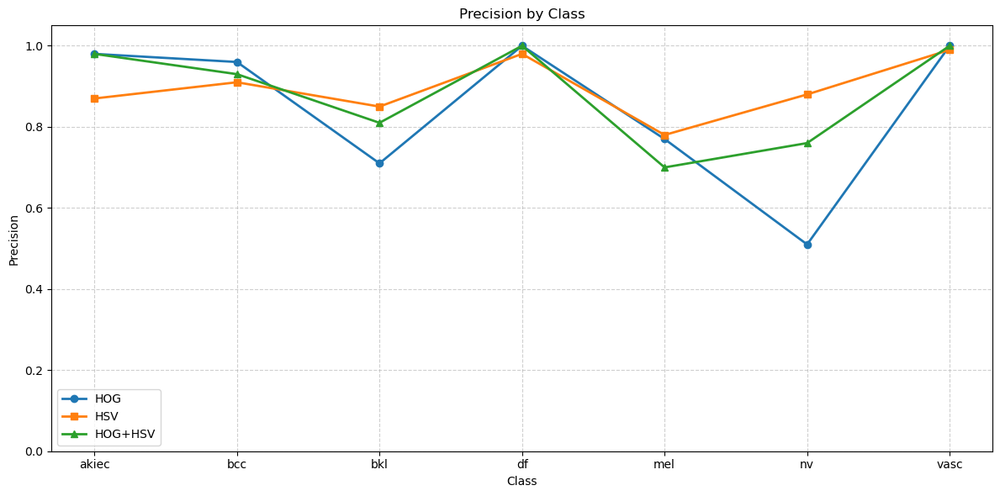

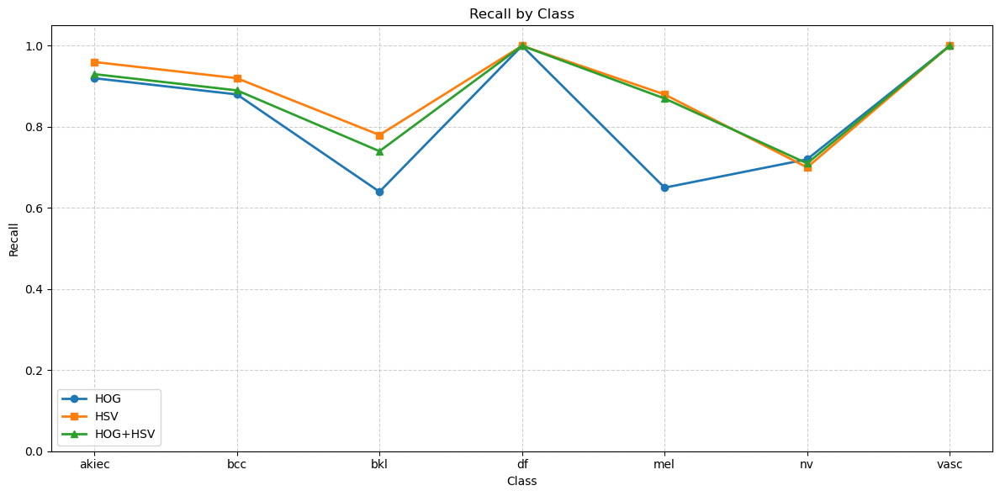

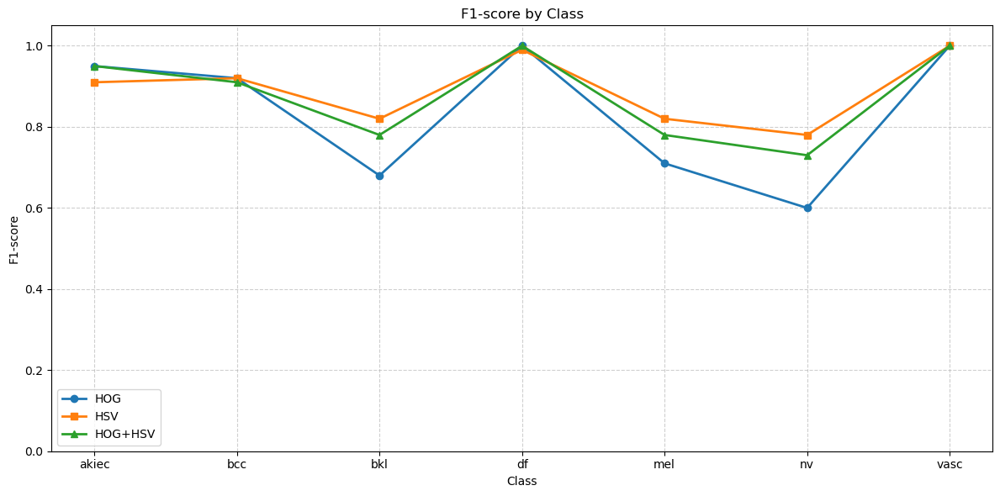

In [59]:
# Only include per-class rows (excluding 'accuracy', 'macro avg', etc.)
def plot_classwise_metrics(df_hog, df_hsv, df_hog_hsv):
    metrics = ['precision', 'recall', 'f1-score']
    classes = df_hog['class'][:7]  # assume same classes across all

    # Convert metrics to float
    df_hog = df_hog.loc[:6, metrics].astype(float)
    df_hsv = df_hsv.loc[:6, metrics].astype(float)
    df_hog_hsv = df_hog_hsv.loc[:6, metrics].astype(float)

    for metric in metrics:
        plt.figure(figsize=(12, 6))
        plt.plot(classes, df_hog[metric], marker='o', label='HOG', linewidth=2)
        plt.plot(classes, df_hsv[metric], marker='s', label='HSV', linewidth=2)
        plt.plot(classes, df_hog_hsv[metric], marker='^', label='HOG+HSV', linewidth=2)
        plt.title(f'{metric.capitalize()} by Class')
        plt.xlabel('Class')
        plt.ylabel(metric.capitalize())
        plt.ylim(0, 1.05)
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Call this function after defining all 3 dataframes
plot_classwise_metrics(df_report_hog, df_report_hsv, df_report_hog_hsv)


# Analysis

    Results (see google doc table as well) for HOG, HSV, HOG + HSV (balanced data set, preprocessing for hair, scale, size). 
    Note how while HSV has the best accuracy, HOG + HSV seems to do a better job than HSV for the first minority class.
    So, between HOG, HSV, HOG + HSV - we select HOG + HSV as the best combination so far

# LBP

    LBP (Local Binary Pattern) is a simple yet powerful texture descriptor used in computer vision and image classification tasks.

    LBP encodes the local texture of an image by comparing each pixel with its surrounding neighbors. It creates a binary code that captures texture patterns like edges, corners, flat areas, etc.

    How It Works (Concept)
        Choose a pixel in the image.
        Compare it to its 8 neighbors in a 3×3 window.
        For each neighbor:
        If the neighbor ≥ center pixel → write 1
        Else → write 0
        You get an 8-bit binary number (e.g., 11001010)
        Convert it to decimal → that's the LBP code for that pixel.
        Do this for every pixel → generate an LBP image.

In [61]:
from skimage.feature import local_binary_pattern
import numpy as np
import cv2

def compute_lbp_features(img, radius=1, n_points=8, method='uniform'):
    """
    Compute a normalized LBP histogram from a grayscale version of the RGB image.
    Returns a flat feature vector.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Compute LBP image
    lbp = local_binary_pattern(gray, n_points, radius, method=method)
    
    # Compute histogram of LBP values
    n_bins = int(lbp.max() + 1)
    hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
    
    return hist

# Apply to all images (resized_scale_removed_images is a list of RGB images)
lbp_features = np.array([
    compute_lbp_features(img) for img in resized_scale_removed_images
])


In [62]:
lbp_features.shape

(8659, 10)

In [63]:
# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(raw_labels)

# Step 1: Split into train_val and test
X_trainval, X_test, y_trainval, y_test = train_test_split(
    lbp_features, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Step 2: Cross-validation on train_val
rf = RandomForestClassifier(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42)
cv_results = cross_validate(rf, X_trainval, y_trainval, cv=5, scoring='accuracy')
print("CV Mean Accuracy:", np.mean(cv_results['test_score']))

# Step 3: Train final model on train_val
rf.fit(X_trainval, y_trainval)

CV Mean Accuracy: 0.8165149170925344


RandomForestClassifier(max_depth=20, n_jobs=-1, random_state=42)

In [64]:
# Step 4: Evaluate on test set
y_pred = rf.predict(X_test)
print("\nFinal Evaluation on Held-Out Test Set:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


Final Evaluation on Held-Out Test Set:
              precision    recall  f1-score   support

       akiec       0.88      0.97      0.92       252
         bcc       0.83      0.91      0.87       248
         bkl       0.76      0.65      0.70       245
          df       0.97      1.00      0.99       256
         mel       0.75      0.75      0.75       257
          nv       0.75      0.66      0.70       241
        vasc       0.96      1.00      0.98       233

    accuracy                           0.85      1732
   macro avg       0.84      0.85      0.84      1732
weighted avg       0.84      0.85      0.84      1732



# Combine HOG + HSV + LBP

    for classification

In [66]:
print(f"{ hog_features.shape = }, { hsv_color_hist_features.shape = }, { lbp_features.shape = }")
print(f"{ hog_features.shape[1] + hsv_color_hist_features.shape[1] + lbp_features.shape[1] }")


combined_features_hog_hsv_lbp= np.hstack([hog_features, hsv_color_hist_features, lbp_features])
print(combined_features_hog_hsv_lbp.shape)  

 hog_features.shape = (8659, 26244),  hsv_color_hist_features.shape = (8659, 1024),  lbp_features.shape = (8659, 10)
27278
(8659, 27278)


In [68]:
# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(raw_labels)

# Step 1: Split into train_val and test
X_trainval, X_test, y_trainval, y_test = train_test_split(
    combined_features_hog_hsv_lbp, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Step 2: Cross-validation on train_val
rf = RandomForestClassifier(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42)
cv_results = cross_validate(rf, X_trainval, y_trainval, cv=5, scoring='accuracy')
print("CV Mean Accuracy:", np.mean(cv_results['test_score']))

# Step 3: Train final model on train_val
rf.fit(X_trainval, y_trainval)

CV Mean Accuracy: 0.8569380238694319


RandomForestClassifier(max_depth=20, n_jobs=-1, random_state=42)

In [69]:
# Step 4: Evaluate on test set
y_pred = rf.predict(X_test)
print("\nFinal Evaluation on Held-Out Test Set:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


Final Evaluation on Held-Out Test Set:
              precision    recall  f1-score   support

       akiec       0.95      0.94      0.94       252
         bcc       0.95      0.88      0.92       248
         bkl       0.82      0.74      0.78       245
          df       1.00      1.00      1.00       256
         mel       0.72      0.85      0.78       257
          nv       0.74      0.72      0.73       241
        vasc       1.00      1.00      1.00       233

    accuracy                           0.88      1732
   macro avg       0.88      0.88      0.88      1732
weighted avg       0.88      0.88      0.88      1732



In [71]:
data = {
    "class": ["akiec", "bcc", "bkl", "df", "mel", "nv", "vasc", "accuracy", "macro avg", "weighted avg"],
    "precision": [0.95, 0.95, 0.82, 1.00, 0.72, 0.74, 1.00, None, 0.88, 0.88],
    "recall":    [0.94, 0.88, 0.74, 1.00, 0.85, 0.72, 1.00, 0.88, 0.88, 0.88],
    "f1-score":  [0.94, 0.92, 0.78, 1.00, 0.78, 0.73, 1.00, 0.88, 0.88, 0.88],
    "support":   [252, 248, 245, 256, 257, 241, 233, 1732, 1732, 1732]
}

df_report_hog_hsv_lbp = pd.DataFrame(data)



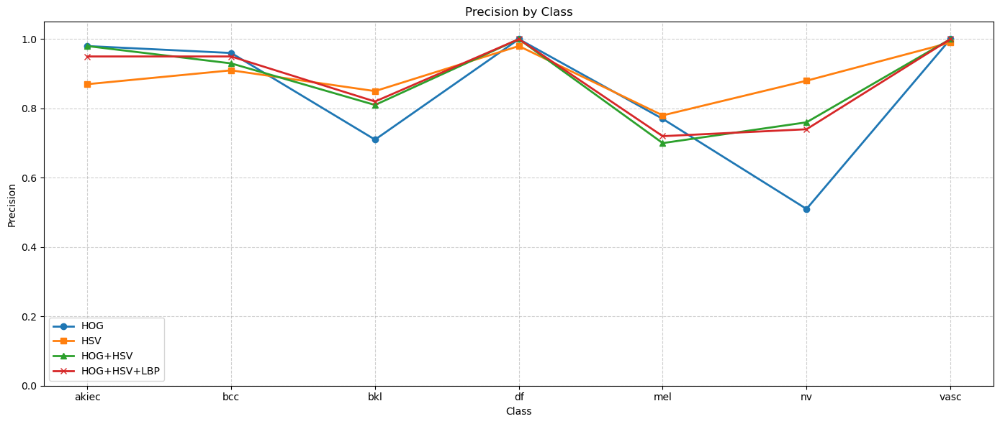

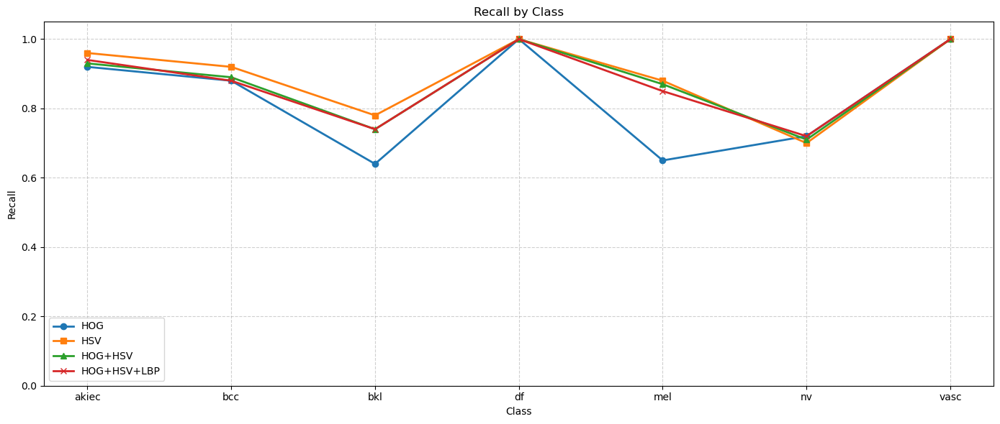

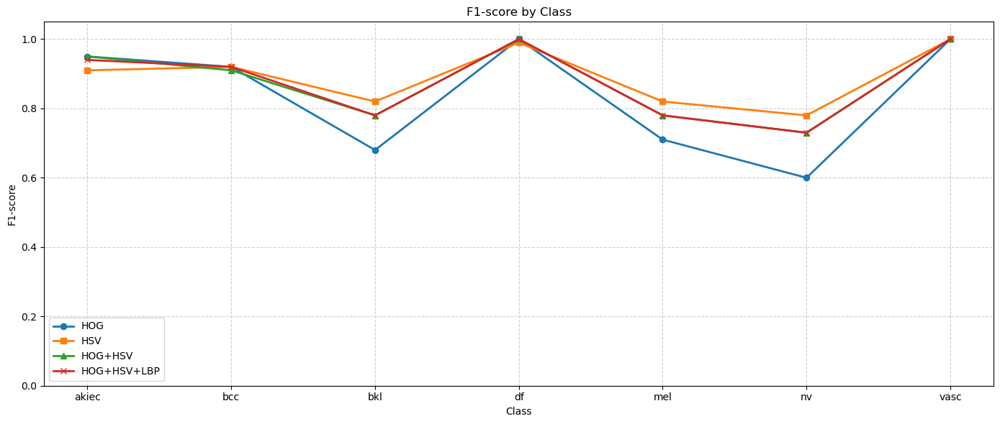

In [72]:
def plot_classwise_metrics(df_hog, df_hsv, df_hog_hsv, df_hog_hsv_lbp):
    metrics = ['precision', 'recall', 'f1-score']
    classes = df_hog['class'][:7]  # assume same classes across all

    # Convert metrics to float (only class-wise rows)
    df_hog = df_hog.loc[:6, metrics].astype(float)
    df_hsv = df_hsv.loc[:6, metrics].astype(float)
    df_hog_hsv = df_hog_hsv.loc[:6, metrics].astype(float)
    df_hog_hsv_lbp = df_hog_hsv_lbp.loc[:6, metrics].astype(float)

    for metric in metrics:
        plt.figure(figsize=(14, 6))
        plt.plot(classes, df_hog[metric], marker='o', label='HOG', linewidth=2)
        plt.plot(classes, df_hsv[metric], marker='s', label='HSV', linewidth=2)
        plt.plot(classes, df_hog_hsv[metric], marker='^', label='HOG+HSV', linewidth=2)
        plt.plot(classes, df_hog_hsv_lbp[metric], marker='x', label='HOG+HSV+LBP', linewidth=2)
        plt.title(f'{metric.capitalize()} by Class')
        plt.xlabel('Class')
        plt.ylabel(metric.capitalize())
        plt.ylim(0, 1.05)
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Call the function with all 4 reports
plot_classwise_metrics(df_report_hog, df_report_hsv, df_report_hog_hsv, df_report_hog_hsv_lbp)


Analysis:

On F1 score by class, HOG + HSV + LBP, and HSV are the top performers. HOG + HSV + LBP performs slightly worse than HSV, but we will retain HOG + HSV + LBP for use with complex as that may offer more opportunities for learning feature interactions in a DL model, for reuse, because even though we are using only ML classifier for this project.

